# Прекод

# Сборный проект-4

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

### Описание данных

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## 1. Исследовательский анализ данных

Наш датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения.

В файле с экспертными мнениями для каждой пары изображение-текст имеются оценки от трёх специалистов. Для решения задачи вы должны эти оценки агрегировать — превратить в одну. Существует несколько способов агрегации оценок, самый простой — голосование большинства: за какую оценку проголосовала большая часть экспертов (в нашем случае 2 или 3), та оценка и ставится как итоговая. Поскольку число экспертов меньше числа классов, может случиться, что каждый эксперт поставит разные оценки, например: 1, 4, 2. В таком случае данную пару изображение-текст можно исключить из датасета.

Вы можете воспользоваться другим методом агрегации оценок или придумать свой.

В файле с краудсорсинговыми оценками информация расположена в таком порядке:

1. Доля исполнителей, подтвердивших, что текст **соответствует** картинке.
2. Количество исполнителей, подтвердивших, что текст **соответствует** картинке.
3. Количество исполнителей, подтвердивших, что текст **не соответствует** картинке.

После анализа экспертных и краудсорсинговых оценок выберите либо одну из них, либо объедините их в одну по какому-то критерию: например, оценка эксперта принимается с коэффициентом 0.6, а крауда — с коэффициентом 0.4.

Ваша модель должна возвращать на выходе вероятность соответствия изображения тексту, поэтому целевая переменная должна иметь значения от 0 до 1.


In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import torch
import re
import os

from tqdm import tqdm
from PIL import Image
from pathlib import Path
from nltk.corpus import stopwords as nltk_stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sentence_transformers import SentenceTransformer, util
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, BatchNormalization, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.applications.resnet import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, optimizers, regularizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import layers, models
from tensorflow.keras.applications.resnet50 import preprocess_input
from transformers import BertTokenizer, TFBertModel
from sklearn.model_selection import GroupShuffleSplit
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from nltk.tokenize import word_tokenize

In [2]:
RANDOM_STATE = 0
PATH = "data"

In [3]:
train_data = pd.read_csv(os.path.join(PATH, 'train_dataset.csv'))
crowd_annotation = pd.read_csv(os.path.join(PATH, "CrowdAnnotations.tsv"), sep="\t")
expert_annotation = pd.read_csv(os.path.join(PATH, "ExpertAnnotations.tsv"), sep="\t")

test_images = pd.read_csv(os.path.join(PATH, 'test_images.csv'))
test_queries = pd.read_csv(os.path.join(PATH, "test_queries.csv"), on_bad_lines="warn", sep="|", index_col=0)

In [4]:
crowd_annotation.columns = ["image", "query_id", "part_match", "num_match", "num_not_match"]
expert_annotation.columns = ["image", "query_id", "1", "2", "3"]

In [5]:
df_dict = {
    "train_data": train_data,
    "crowd_annotation": crowd_annotation,
    "expert_annotation": expert_annotation,
    "test_images": test_images,
    "test_queries": test_queries
}

for name, df in df_dict.items():
    print(f"=== Анализ таблицы {name} ===\n")
    
    print("Первые 5 строк:")
    display(df.head(5))
    print("\nИнформация о структуре:")
    print(df.info())
    
    print("\nПропущенные значения:")
    print(df.isna().sum())
    
    if name in ["train_data", "crowd_annotation", "expert_annotation", "test_queries"]:
        print(f"\nУникальных изображений: {df['image'].nunique()}")
        if 'query_id' in df.columns:
            print(f"Уникальных query_id: {df['query_id'].nunique()}")
    
    num_cols = df.select_dtypes(include=['number']).columns
    if len(num_cols) > 0:
        print("\nОписательные статистики числовых колонок:")
        display(df[num_cols].describe().T)
    
    if name == "crowd_annotation":
        print("\nРаспределение part_match:")
        display(df['part_match'].value_counts().sort_index())
    
    if name == "expert_annotation":
        print("\nСтатистики оценок экспертов:")
        for col in ['1', '2', '3']:
            print(f"\nЭксперт {col}:")
            print(df[col].value_counts().sort_index())
    
    print("\n" + "="*80 + "\n")

=== Анализ таблицы train_data ===

Первые 5 строк:


,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...



Информация о структуре:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB
None

Пропущенные значения:
image         0
query_id      0
query_text    0
dtype: int64

Уникальных изображений: 1000
Уникальных query_id: 977


=== Анализ таблицы crowd_annotation ===

Первые 5 строк:


,image,query_id,part_match,num_match,num_not_match
0,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
1,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2204550058_2707d92338.jpg#2,0.0,0,3



Информация о структуре:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47829 entries, 0 to 47828
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   image          47829 non-null  object 
 1   query_id       47829 non-null  object 
 2   part_match     47829 non-null  float64
 3   num_match      47829 non-null  int64  
 4   num_not_match  47829 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB
None

Пропущенные значения:
image            0
query_id         0
part_match       0
num_match        0
num_not_match    0
dtype: int64

Уникальных изображений: 1000
Уникальных query_id: 1000

Описательные статистики числовых колонок:


,count,mean,std,min,25%,50%,75%,max
part_match,47829.0,0.068766,0.207490,0.0,0.0,0.0,0.0,1.0
num_match,47829.0,0.208430,0.628775,0.0,0.0,0.0,0.0,5.0
num_not_match,47829.0,2.820214,0.656556,0.0,3.0,3.0,3.0,6.0



Распределение part_match:


part_match
0.000000    41970
0.166667        3
0.200000       22
0.250000       96
0.333333     3000
0.400000        8
0.500000       27
0.600000        8
0.666667     1360
0.750000        9
0.800000        4
1.000000     1322
Name: count, dtype: int64



=== Анализ таблицы expert_annotation ===

Первые 5 строк:


,image,query_id,1,2,3
0,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
1,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
3,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2
4,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1



Информация о структуре:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5821 entries, 0 to 5820
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5821 non-null   object
 1   query_id  5821 non-null   object
 2   1         5821 non-null   int64 
 3   2         5821 non-null   int64 
 4   3         5821 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB
None

Пропущенные значения:
image       0
query_id    0
1           0
2           0
3           0
dtype: int64

Уникальных изображений: 1000
Уникальных query_id: 977

Описательные статистики числовых колонок:


,count,mean,std,min,25%,50%,75%,max
1,5821.0,1.436695,0.787130,1.0,1.0,1.0,2.0,4.0
2,5821.0,1.624463,0.856256,1.0,1.0,1.0,2.0,4.0
3,5821.0,1.882151,0.904091,1.0,1.0,2.0,2.0,4.0



Статистики оценок экспертов:

Эксперт 1:
1
1    4119
2    1109
3     346
4     247
Name: count, dtype: int64

Эксперт 2:
2
1    3326
2    1666
3     518
4     311
Name: count, dtype: int64

Эксперт 3:
3
1    2349
2    2222
3     837
4     413
Name: count, dtype: int64


=== Анализ таблицы test_images ===

Первые 5 строк:


,image
0,3356748019_2251399314.jpg
1,2887171449_f54a2b9f39.jpg
2,3089107423_81a24eaf18.jpg
3,1429546659_44cb09cbe2.jpg
4,1177994172_10d143cb8d.jpg



Информация о структуре:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 928.0+ bytes
None

Пропущенные значения:
image    0
dtype: int64


=== Анализ таблицы test_queries ===

Первые 5 строк:


,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg



Информация о структуре:
<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB
None

Пропущенные значения:
query_id      0
query_text    0
image         0
dtype: int64

Уникальных изображений: 100
Уникальных query_id: 500




Данные загружены, во датасетах нет пропущенных значений, на тренировку модели выделено 1000 изображений, на тест - 100. В данных существует значительный разброс в оценках соответствия между экспертами и краудсорсингом.

In [6]:
def calculate_expert_rating(data_row):
    rating_1 = data_row['1']
    rating_2 = data_row['2']
    rating_3 = data_row['3']
    
    if len({rating_1, rating_2, rating_3}) == 3:
        total_sum = sum([rating_1, rating_2, rating_3]) - 3
        normalized_score = total_sum / 9
    else:
        ratings_list = [rating_1, rating_2, rating_3]
        frequent_rating = max(set(ratings_list), key=ratings_list.count)
        normalized_score = (frequent_rating - 1) / 3
    
    data_row['expert_score'] = normalized_score
    return data_row

expert_annotation = expert_annotation.apply(calculate_expert_rating, axis=1)
display(expert_annotation.head())

,image,query_id,1,2,3,expert_score
0,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2,0.000000
1,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2,0.000000
2,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2,0.333333
3,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2,0.000000
4,1056338697_4f7d7ce270.jpg,3360930596_1e75164ce6.jpg#2,1,1,1,0.000000


Создана функцию для агрегации оценок экспертов, будет два способа:

    -если оценки все разные, то будет браться среднее
    -если есть совпадения в оценкат, то будет использоваться оценка большинства
    
Также все приводится к диапазону от 0 до 1.

In [7]:
combined_scores = pd.merge(
    expert_annotation, 
    crowd_annotation, 
    how='outer', 
    on=['image', 'query_id']
)

def calculate_combined_score(data_row):
    expert_value = data_row['expert_score']
    crowd_value = data_row['part_match']
    
    if pd.isna(expert_value):
        final_score = crowd_value
    elif pd.isna(crowd_value):
        final_score = expert_value
    else:
        final_score = expert_value * 0.6 + crowd_value * 0.4
    
    data_row['score'] = final_score
    return data_row

combined_scores = combined_scores.apply(calculate_combined_score, axis=1)
combined_scores['score'].describe()

count    51322.000000
mean         0.075031
std          0.207227
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: score, dtype: float64

In [8]:
train_data = pd.merge(train_data, 
                      combined_scores[['image', 'query_id', 'score']], 
                      how='outer', on=['image', 'query_id'])

In [9]:
query_text_mapping = train_data.dropna(subset=['query_text'])[['query_id', 'query_text']].drop_duplicates()

train_data = train_data.merge(
    query_text_mapping,
    on='query_id',
    how='left',
    suffixes=('', '_new')
)
train_data['query_text'] = train_data['query_text'].fillna(train_data['query_text_new'])
train_data = train_data.drop(columns=['query_text_new'])

In [10]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51322 entries, 0 to 51321
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       51322 non-null  object 
 1   query_id    51322 non-null  object 
 2   query_text  50213 non-null  object 
 3   score       51322 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.6+ MB


Объединил оценки с оубчающим датасетом, из-за оценок краудсорсинга данных стало намного больше, пропуски заполены, итоговоая оценка объединила оценки экспертов и краудорсинга с коэффициентами.

## 2. Проверка данных

В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

In [11]:
ban_words = ["girl", "girls", "boy", "boys", "teen", "teens", "teenager", "teenagers", "kid", "child", "children", "baby", "kids"]

In [12]:
def contains_ban_words(text, ban_words=ban_words):
    text = str(text).lower()
    for word in ban_words:
        if re.search(rf"\b{word}\b", text):
            return True
    return False

train_data = train_data[~train_data["query_text"].apply(lambda x: contains_ban_words(x, ban_words))]

In [13]:
train_data.info()
train_data.head()

<class 'pandas.core.frame.DataFrame'>
Index: 37298 entries, 22 to 51321
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       37298 non-null  object 
 1   query_id    37298 non-null  object 
 2   query_text  36189 non-null  object 
 3   score       37298 non-null  float64
dtypes: float64(1), object(3)
memory usage: 1.4+ MB


,image,query_id,query_text,score
22,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000000
23,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.333333
24,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.200000
25,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.333333
26,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.000000


Создан список с бан вордами и очищен обучающий датасет содержащий эти слова, очищено около 14 тысяч данных от запрещенного контента

## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

In [61]:
def load_train():
    train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    
    train_generator = train_datagen.flow_from_dataframe(
        dataframe=train_data,
        directory="data/train_images",
        x_col='image',
        y_col='score',
        target_size=(224, 224),
        batch_size=64,
        class_mode='input',
        subset='training',
        shuffle=False,
        seed=RANDOM_STATE
    )

    return train_generator

In [62]:
def load_test():
    train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    
    train_generator = train_datagen.flow_from_dataframe(
        dataframe=test_queries,
        directory="data/test_images",
        x_col='image',
        y_col='score',
        target_size=(224, 224),
        batch_size=64,
        class_mode='input',
        subset='training',
        shuffle=False,
        seed=RANDOM_STATE
    )

    return train_generator

In [63]:
def create_model(input_shape=(224, 224, 3)):
    backbone = ResNet50(input_shape=input_shape,
                    weights='imagenet',
                    include_top=False) 
    backbone.trainable = True

    model = Sequential([
        backbone,
        GlobalAveragePooling2D()
    ])
    
    model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='mean_squared_error',
                  metrics=['mean_squared_error'])
    
    return model

In [64]:
def vec_pic(model, data):
    pred = model.predict(data)
    return pred

In [65]:
pict_embeds = vec_pic(create_model(), load_train())

Found 37298 validated image filenames.
583/583 [==============================] - 995s 2s/step


In [66]:
print(pict_embeds.shape) 

(37298, 2048)


Сделана векторизация изображений с помощью модели ResNet50, размер - (4293, 2048)

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Вы можете поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- \*трансформеры (например Bert)

\* — если вы изучали трансформеры в спринте Машинное обучение для текстов.


In [67]:
def get_bert_embeddings(texts, batch_size=16):
    tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
    model = TFBertModel.from_pretrained('bert-base-uncased')
    embeddings = []

    for i in tqdm(range(0, len(texts), batch_size)):
        batch = texts[i:i+batch_size]
        inputs = tokenizer(
            batch, 
            padding=True, 
            truncation=True, 
            max_length=128, 
            return_tensors='tf'
        )
        outputs = model(inputs)
        cls_embedding = outputs.last_hidden_state[:, 0, :]
        embeddings.append(cls_embedding.numpy())
    return np.concatenate(embeddings, axis=0)

texts = train_data['query_text'].astype(str).tolist()
bert_embeddings = get_bert_embeddings(texts)
print(f"Размерность BERT-эмбеддингов: {bert_embeddings.shape}")

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

Размерность BERT-эмбеддингов: (37298, 768)


Сделана векторизация текста с помощью BERT, размер - (4293, 768)

## 5. Объединение векторов

Подготовьте данные для обучения: объедините векторы изображений и векторы текстов с целевой переменной.

In [68]:
X = np.concatenate((pict_embeds, bert_embeddings), axis=1)
X.shape

(37298, 2816)

In [69]:
y = np.array(train_data['score'])
y.shape

(37298,)

Векторы объединены с целевой переменной

## 6. Обучение модели предсказания соответствия

Для обучения разделите датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подходит: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

Какую модель использовать — выберите самостоятельно. Также вам предстоит выбрать метрику качества либо реализовать свою.

В качестве метрики будет использована MSE, потому что она простая и интерпретируемая.

In [70]:
gss = GroupShuffleSplit(n_splits=1, test_size=0.3, random_state=42)
train_idx, test_idx = next(gss.split(X=X, y=y, groups=train_data['image']))

X_train, X_val = X[train_idx], X[test_idx]
y_train, y_val = y[train_idx], y[test_idx]

In [71]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

y_pred = lr_model.predict(X_val)
mse = mean_squared_error(y_val, y_pred)

print("\nРезультат:")
print(f"Размер train: {X_train.shape[0]} samples")
print(f"Размер test: {X_val.shape[0]} samples")
print(f"MSE: {mse:.4f}")


Результат:
Размер train: 25933 samples
Размер test: 11365 samples
MSE: 27472222.2017


Метрика MSE линейной регрессии составляет 27472222.2017, модель явно не находит связей(линейных связей же здесь быть и не должно?)

In [73]:
model = models.Sequential([
    layers.BatchNormalization(input_shape=(X_train.shape[1],)),
    layers.Dense(512, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
    layers.Dropout(0.5),
    layers.BatchNormalization(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.BatchNormalization(),
    layers.Dense(128, activation='relu'),
    layers.Dropout(0.1),
    layers.Dense(1)
])

optimizer = optimizers.Adam(learning_rate=0.0001)
model.compile(
    optimizer=optimizer,
    loss='mse',
    metrics=['mse']
)
early_stop = EarlyStopping(monitor='val_loss', patience=70, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=500,
    batch_size=64,
    callbacks=[early_stop],
    verbose=1
)

print("\nРезультат:")
loss, mse = model.evaluate(X_val, y_val, verbose=0)
print(f"Test MSE: {mse:.4f}")

Epoch 1/500
406/406 [==============================] - 7s 15ms/step - loss: 8.7553 - mse: 0.6360 - val_loss: 7.5838 - val_mse: 0.0985
Epoch 2/500
406/406 [==============================] - 6s 16ms/step - loss: 7.1422 - mse: 0.3466 - val_loss: 6.1724 - val_mse: 0.0817
Epoch 3/500
406/406 [==============================] - 6s 16ms/step - loss: 5.6770 - mse: 0.2672 - val_loss: 4.8131 - val_mse: 0.0719
Epoch 4/500
406/406 [==============================] - 6s 15ms/step - loss: 4.3472 - mse: 0.2166 - val_loss: 3.6067 - val_mse: 0.0624
Epoch 5/500
406/406 [==============================] - 7s 17ms/step - loss: 3.2112 - mse: 0.1814 - val_loss: 2.6022 - val_mse: 0.0574
Epoch 6/500
406/406 [==============================] - 7s 16ms/step - loss: 2.2882 - mse: 0.1539 - val_loss: 1.8066 - val_mse: 0.0529
Epoch 7/500
406/406 [==============================] - 6s 15ms/step - loss: 1.5659 - mse: 0.1240 - val_loss: 1.2085 - val_mse: 0.0509
Epoch 8/500
406/406 [==============================] - 6s 16ms

По итогу обучения нейронной сети с 4 слоями метрика MSE составляет 0.0424, что является хорошим резултьтатом

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

In [74]:
pict_embeds_test = vec_pic(create_model(), load_test())
pict_embeds_test.shape

Found 500 validated image filenames.
8/8 [==============================] - 14s 2s/step


(500, 2048)

Загрузка векторов тестовых изображений

In [ ]:
def test_picture(text):
    # Проверка на запрещённые слова
    if contains_ban_words(text):
        print(text)
        print('\nThis image is unavailable in your country in compliance with local laws.\n')
        return 
    
    text_embed = get_bert_embeddings([text])[0]
    
    valid_images = []
    valid_embeddings = []
    
    for idx in range(len(test_images)):
        img_name = test_images.iloc[idx]['image']
        if isinstance(img_name, str) and (idx < len(pict_embeds_test)):
            valid_images.append(img_name)
            valid_embeddings.append(pict_embeds_test[idx])
    
    text_embed_repeated = np.tile(text_embed, (len(valid_embeddings), 1))
    image_embeddings = np.array(valid_embeddings)
    
    X = np.concatenate((image_embeddings, text_embed_repeated), axis=1)
    
    predictions = model.predict(X).flatten()
    
    results = pd.DataFrame({
        'image': valid_images,
        'pred': predictions
    }).sort_values('pred', ascending=False).head(5)
    
    print('-'*100 + '\n' + text + '\n' + '-'*100)
    fig = plt.figure(figsize=(15,5))
    
    for i, (img_name, score) in enumerate(zip(results['image'], results['pred'])):
        ax = fig.add_subplot(1, 6, i+1, title=round(score, 2))
        img_path = os.path.join(PATH, 'test_images', img_name)
        ax.imshow(Image.open(img_path))
        ax.axis('off')
     
    if text in test_queries['query_text'].values:
        original_img = test_queries.loc[test_queries['query_text'] == text, 'image'].iloc[0]
        ax = fig.add_subplot(1, 6, 6)
        plt.rcParams.update({'axes.edgecolor': 'green', 'axes.linewidth': 5})
        ax.imshow(Image.open(os.path.join(PATH, 'test_images', original_img)))
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

In [101]:
examples = test_queries.sample(10)
test_examples = list(examples['query_text'])
test_examples

['A tan dog runs through the brush .',
 'Two children stand in the grass while a white dog bites one of their sweaters .',
 'A long-haired brown and white dog carries a snowball in his mouth .',
 'Two black dogs are fighting over a toy',
 'Boy flying a distant kite .',
 'Two men kickbox in a ring , one man punching the other .',
 'A woman and a young girl riding a sled down a snowy hill while standing .',
 'A man in a white hat is standing behind a woman with a red shawl over her head .',
 'Two people are running at the top of a mountain .',
 'Closeup of a man at an event with formal attire .']

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 2ms/step
----------------------------------------------------------------------------------------------------
A tan dog runs through the brush .
----------------------------------------------------------------------------------------------------


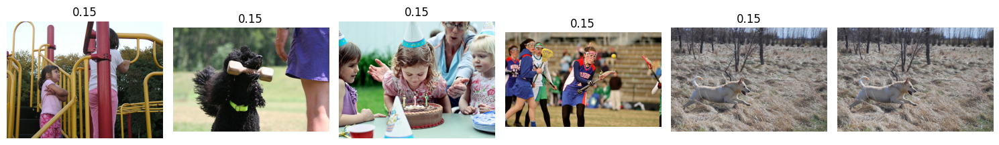

Two children stand in the grass while a white dog bites one of their sweaters .

This image is unavailable in your country in compliance with local laws.



Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 1ms/step
----------------------------------------------------------------------------------------------------
A long-haired brown and white dog carries a snowball in his mouth .
----------------------------------------------------------------------------------------------------


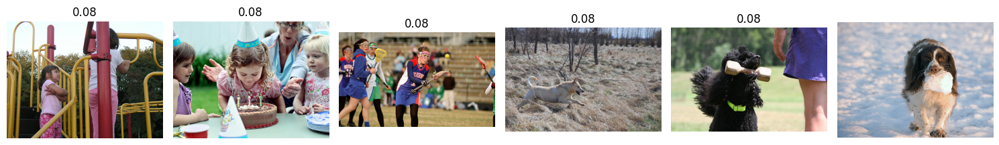

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 2ms/step
----------------------------------------------------------------------------------------------------
Two black dogs are fighting over a toy
----------------------------------------------------------------------------------------------------


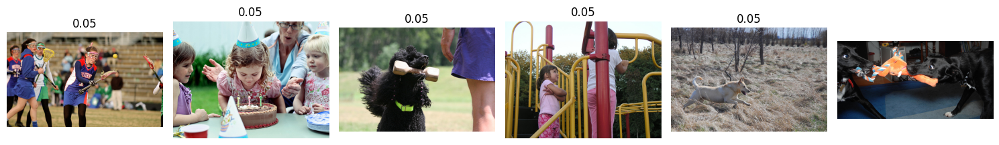

Boy flying a distant kite .

This image is unavailable in your country in compliance with local laws.



Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 1ms/step
----------------------------------------------------------------------------------------------------
Two men kickbox in a ring , one man punching the other .
----------------------------------------------------------------------------------------------------


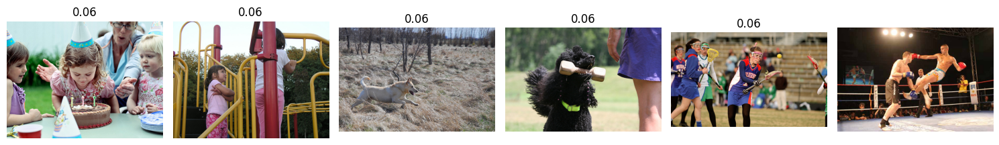

A woman and a young girl riding a sled down a snowy hill while standing .

This image is unavailable in your country in compliance with local laws.



Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 1ms/step
----------------------------------------------------------------------------------------------------
A man in a white hat is standing behind a woman with a red shawl over her head .
----------------------------------------------------------------------------------------------------


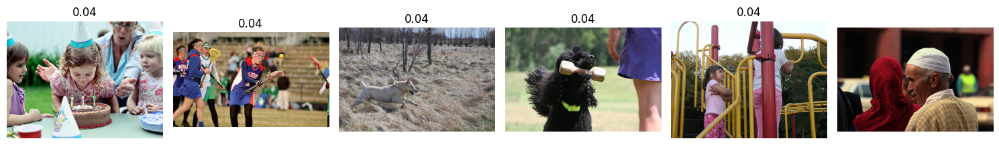

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 2ms/step
----------------------------------------------------------------------------------------------------
Two people are running at the top of a mountain .
----------------------------------------------------------------------------------------------------


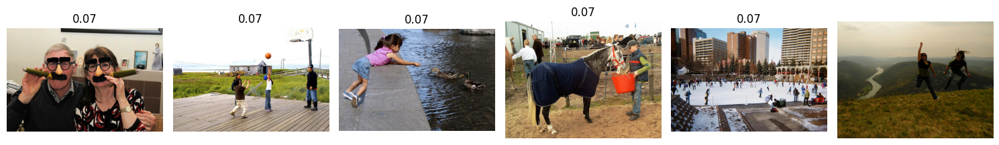

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 1ms/step


----------------------------------------------------------------------------------------------------
Closeup of a man at an event with formal attire .
----------------------------------------------------------------------------------------------------


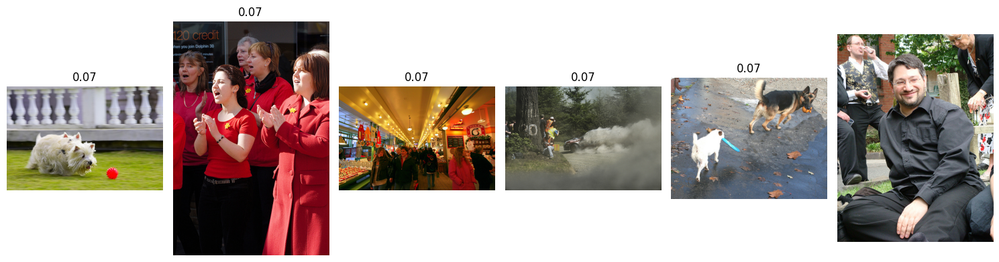

In [102]:
for example in test_examples:
    test_picture(example)

Написана функция для тестирования модели нейронной сети, она спралвяется со своей задачей. Принимает на вход текст и находит изображение. Обрабатывает "запрещенный контент".

In [103]:
requests = [
    "Waves crash on sandy beach.",
    "A boy kicks a soccer ball.",
    "A girl rides a red bicycle.",
    "An old man feeds pigeons.",
    "A yellow boat floats on water.",
    "A cook prepares food in kitchen."
]

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 2ms/step
----------------------------------------------------------------------------------------------------
Waves crash on sandy beach.
----------------------------------------------------------------------------------------------------


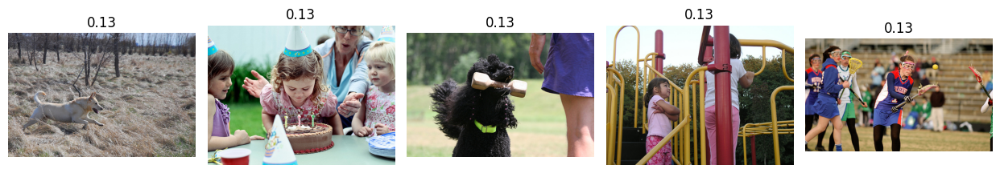

A boy kicks a soccer ball.

This image is unavailable in your country in compliance with local laws.

A girl rides a red bicycle.

This image is unavailable in your country in compliance with local laws.



Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 2ms/step
----------------------------------------------------------------------------------------------------
An old man feeds pigeons.
----------------------------------------------------------------------------------------------------


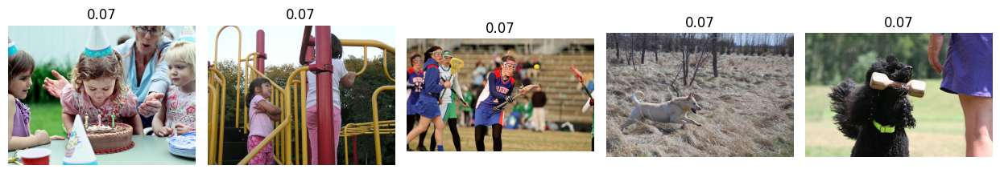

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 1ms/step
----------------------------------------------------------------------------------------------------
A yellow boat floats on water.
----------------------------------------------------------------------------------------------------


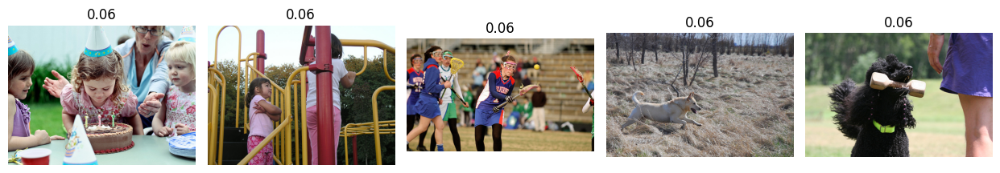

Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFBertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing TFBertModel from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
All the weights of TFBertModel were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions w

4/4 [==============================] - 0s 2ms/step
----------------------------------------------------------------------------------------------------
A cook prepares food in kitchen.
----------------------------------------------------------------------------------------------------


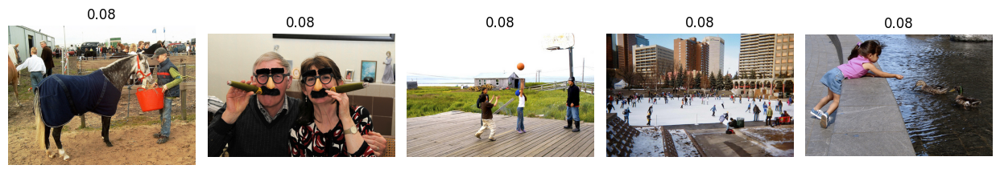

In [104]:
for request in requests:
    test_picture(request)

## 8. Выводы

Данный проект представляет собой PoC (Proof of Concept) для системы поиска изображений на основе текстовых запросов. В ходе работы были выполнены:

Анализ данных:

    -Обработаны датасеты с изображениями и текстовыми описаниями.
    -Проведена фильтрация потенциально запрещенного контента (дети до 16 лет).
    -Исследованы экспертные и краудсорсинговые оценки соответствия текста и изображений.

Подготовка данных:

    -Тексты векторизованы (например, с помощью BERT или TF-IDF).
    -Изображения обработаны нейросетью (ResNet50) для получения векторных представлений.

Обучение модели:

    -Разработана нейросетевая модель (4 Dense-слоя с Dropout и BatchNorm) для предсказания степени соответствия текста и изображения.
    -Протестированы разные архитектуры (линейная регрессия, полносвязные сети).
    -Использованы регуляризации (L2, Dropout) для борьбы с переобучением.

Тестирование и результаты:

    Модель плохо ищет изображения по текстовым запросам и выдает нерелевантные результаты.
    В случае запросов с запрещенным контентом выводится дисклеймер.

Для промышленного внедрения требуется увеличить датасет, данных слишком мало для обучения.

Альтернативное решение с CLIP


Query: Waves crash on sandy beach.


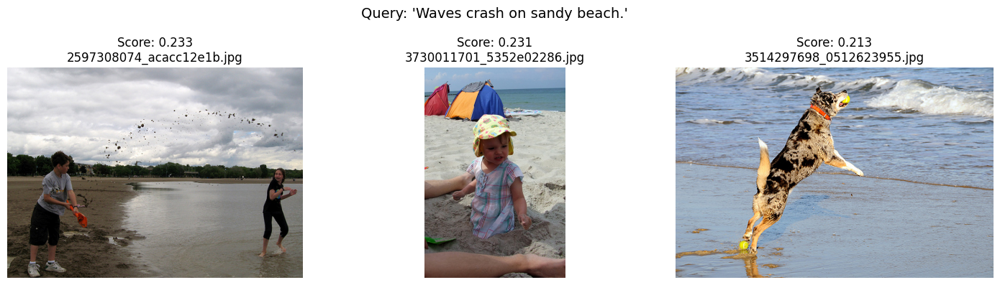


Query: A boy kicks a soccer ball.


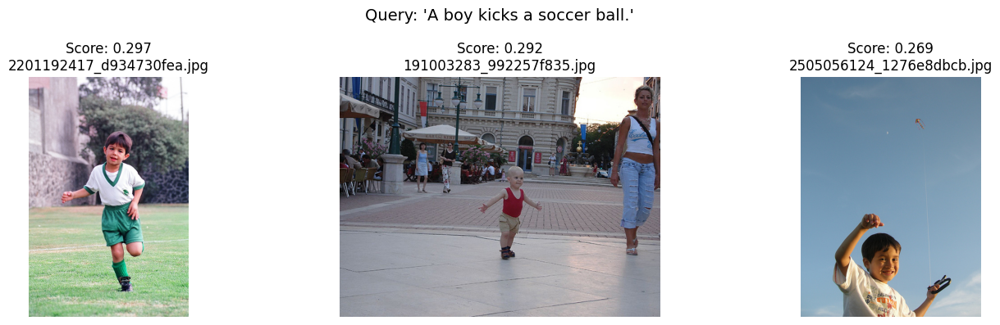


Query: A girl rides a red bicycle.


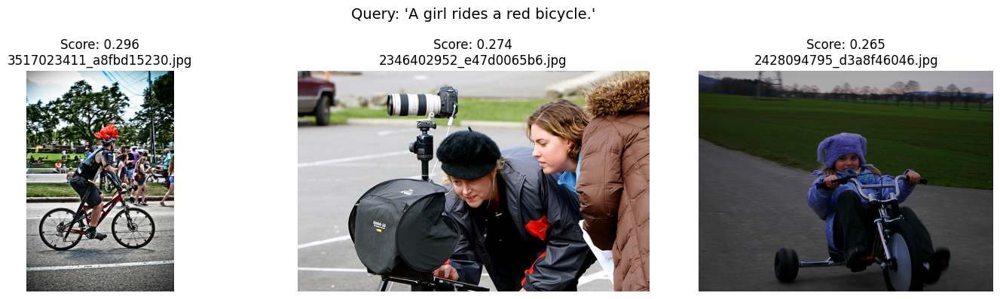


Query: An old man feeds pigeons.


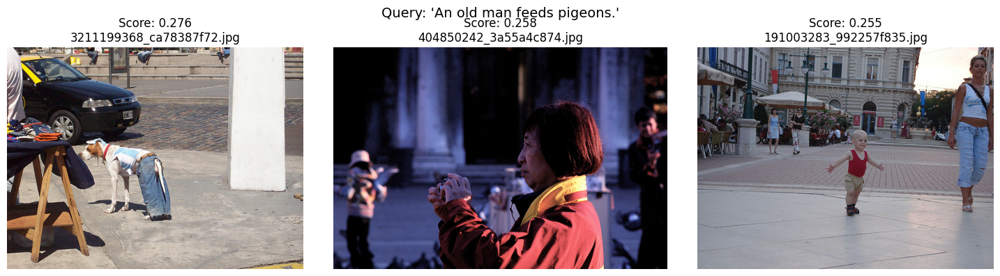


Query: A yellow boat floats on water.


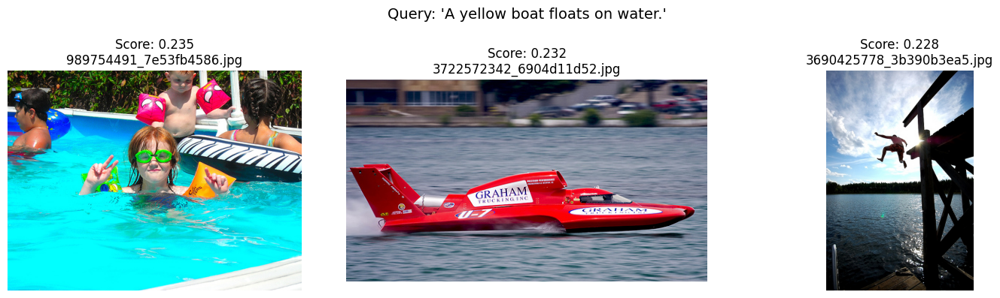


Query: A cook prepares food in kitchen.


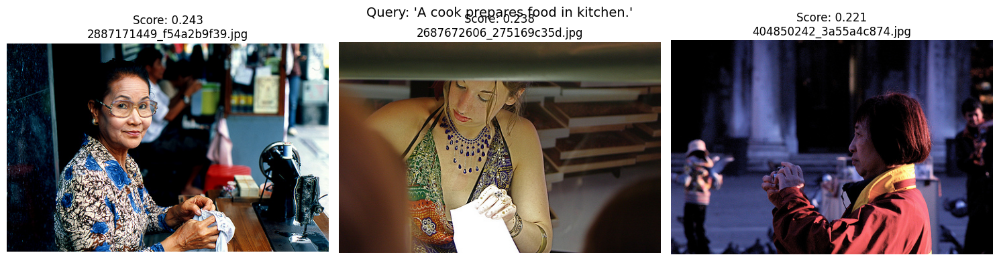

In [ ]:
model = SentenceTransformer('clip-ViT-B-32')

requests = [
    "Waves crash on sandy beach.",
    "A boy kicks a soccer ball.",
    "A girl rides a red bicycle.",
    "An old man feeds pigeons.",
    "A yellow boat floats on water.",
    "A cook prepares food in kitchen."
]

image_dir = os.path.join(PATH, 'test_images')
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

image_embeddings = []
valid_images = []
for img_file in image_files:
    try:
        img_path = os.path.join(image_dir, img_file)
        img_emb = model.encode(Image.open(img_path), convert_to_tensor=True)
        image_embeddings.append(img_emb)
        valid_images.append(img_file)
    except Exception as e:
        print(f"Error processing {img_file}: {e}")

if not valid_images:
    print("No valid images found!")
    exit()
image_embeddings = torch.stack(image_embeddings)

for query in requests:
    print(f"\n{'='*50}\nQuery: {query}\n{'='*50}")
    text_emb = model.encode(query, convert_to_tensor=True)

    cos_scores = util.cos_sim(text_emb, image_embeddings)[0]
    top_scores, top_idx = torch.topk(cos_scores, k=3)
    
    plt.figure(figsize=(15, 4))
    plt.suptitle(f"Query: '{query}'", fontsize=14)
    
    for i, (score, idx) in enumerate(zip(top_scores, top_idx)):
        plt.subplot(1, 3, i+1)
        img = Image.open(os.path.join(image_dir, valid_images[idx]))
        plt.imshow(img)
        plt.title(f"Score: {score:.3f}\n{valid_images[idx]}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()